###INFORME TÉCNICO DATASETS MUSICALES EXISTENTES by John Kennedy Landazuri Sandoval


# MediaEval

**MediaEval Dataset**

El MediaEval Dataset es un conjunto de datos musicales que destaca por su completo etiquetado emocional.

se extrae una versión de este dataset de kaggle https://www.kaggle.com/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music



In [1]:
import numpy as np
import pandas as pd

import os





In [7]:
!pip install opendatasets

In [8]:
import opendatasets as od


In [19]:
dataset_link="https://www.kaggle.com/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music"
od.download(dataset_link)



Please provide your Kaggle credentials to download this dataset. Learn more: http://bit.ly/kaggle-creds
Your Kaggle username: jkls1998
Your Kaggle Key: ··········
Dataset URL: https://www.kaggle.com/datasets/imsparsh/deam-mediaeval-dataset-emotional-analysis-in-music


100%|██████████| 1.83G/1.83G [00:34<00:00, 56.9MB/s]


In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

#cargando el conjunto estadístico
static_annotations = pd.read_csv('/content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_Annotations/annotations/annotations averaged per song/song_level/static_annotations_averaged_songs_1_2000.csv')
dynamic_annotations_arousal = pd.read_csv('/content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_Annotations/annotations/annotations averaged per song/dynamic (per second annotations)/arousal.csv')
dynamic_annotations_valence = pd.read_csv('/content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_Annotations/annotations/annotations averaged per song/dynamic (per second annotations)/valence.csv')
static_annotations.columns = static_annotations.columns.str.strip()
dynamic_annotations_arousal.columns = dynamic_annotations_arousal.columns.str.strip()
dynamic_annotations_valence.columns = dynamic_annotations_valence.columns.str.strip()

# Primeras filas del dataset
print("Vista general:")
print(static_annotations.head())

# Información dataset
print("\nInformación Dataset:")
print(static_annotations.info())

# Resumen de estadísticas
print("\nResumen estadistico:")
print(static_annotations.describe())

Vista general:
   song_id  valence_mean  valence_std  arousal_mean  arousal_std
0        2           3.1         0.94           3.0         0.63
1        3           3.5         1.75           3.3         1.62
2        4           5.7         1.42           5.5         1.63
3        5           4.4         2.01           5.3         1.85
4        7           5.8         1.47           6.4         1.69

Información Dataset:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1744 entries, 0 to 1743
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   song_id       1744 non-null   int64  
 1   valence_mean  1744 non-null   float64
 2   valence_std   1744 non-null   float64
 3   arousal_mean  1744 non-null   float64
 4   arousal_std   1744 non-null   float64
dtypes: float64(4), int64(1)
memory usage: 68.3 KB
None

Resumen estadistico:
           song_id  valence_mean  valence_std  arousal_mean  arousal_std
count  1744.000

In [22]:
print("Columnnas en el dataset:")
print(static_annotations.columns)

Columnnas en el dataset:
Index(['song_id', 'valence_mean', 'valence_std', 'arousal_mean',
       'arousal_std'],
      dtype='object')


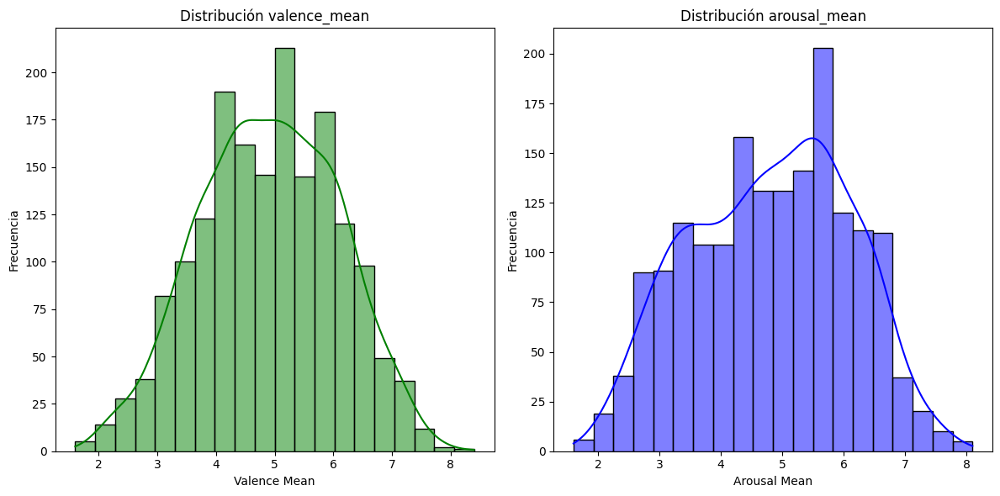

In [23]:
# Vemos la distribución del valence_mean and arousal_mean
plt.figure(figsize=(12, 6))

# Distribución valence_mean
plt.subplot(1, 2, 1)
sns.histplot(static_annotations['valence_mean'], kde=True, color='green', bins=20)
plt.title('Distribución valence_mean')
plt.xlabel('Valence Mean')
plt.ylabel('Frecuencia')

# Distribución arousal_mean
plt.subplot(1, 2, 2)
sns.histplot(static_annotations['arousal_mean'], kde=True, color='blue', bins=20)
plt.title('Distribución arousal_mean')
plt.xlabel('Arousal Mean')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()


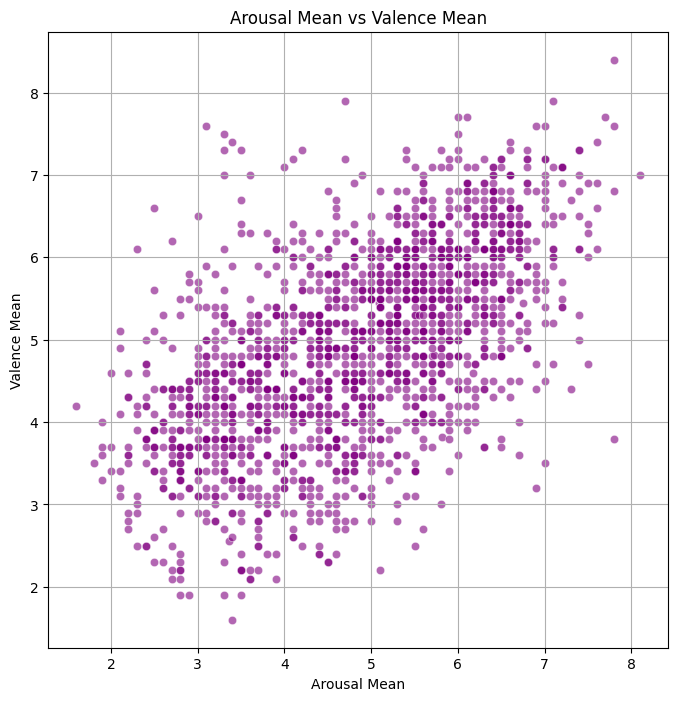

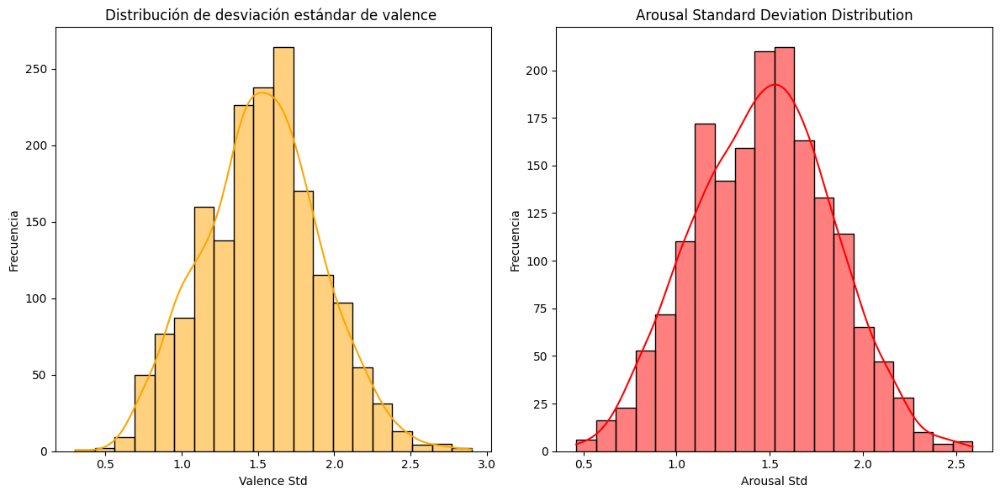

<Figure size 640x480 with 0 Axes>

In [24]:
# Diagrama de dispersión para arousal_mean vs valence_mean
plt.figure(figsize=(8, 8))
sns.scatterplot(x='arousal_mean', y='valence_mean', data=static_annotations, alpha=0.6, color='purple')
plt.title('Arousal Mean vs Valence Mean')
plt.xlabel('Arousal Mean')
plt.ylabel('Valence Mean')
plt.grid(True)
plt.show()

# analizar variabilidad (desviación estandar)
plt.figure(figsize=(12, 6))

# Distribución Valence_std
plt.subplot(1, 2, 1)
sns.histplot(static_annotations['valence_std'], kde=True, color='orange', bins=20)
plt.title('Distribución de desviación estándar de valence ')
plt.xlabel('Valence Std')
plt.ylabel('Frecuencia')

# Distribución Arousal_std
plt.subplot(1, 2, 2)
sns.histplot(static_annotations['arousal_std'], kde=True, color='red', bins=20)
plt.title('Arousal Standard Deviation Distribution')
plt.xlabel('Arousal Std')
plt.ylabel('Frecuencia')

plt.tight_layout()
plt.show()

plt.tight_layout()
plt.show()


In [25]:
import pandas as pd
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import os

# Separar el arousal y el valence
arousal_low_threshold = 2
arousal_high_threshold = 7.5
arousal_medium_range = (5, 5)

valence_low_threshold = 2
valence_high_threshold = 7.5
valence_medium_range = (5, 5)

# Categorizado basado en arousal
arousal_low = static_annotations[static_annotations['arousal_mean'] < arousal_low_threshold]
arousal_high = static_annotations[static_annotations['arousal_mean'] > arousal_high_threshold]
arousal_medium = static_annotations[static_annotations['arousal_mean'].between(*arousal_medium_range)]

# Categorizado basado en valence
valence_low = static_annotations[static_annotations['valence_mean'] < valence_low_threshold]
valence_high = static_annotations[static_annotations['valence_mean'] > valence_high_threshold]
valence_medium = static_annotations[static_annotations['valence_mean'].between(*valence_medium_range)]

# conteo por categorías
print(f"Arousal Bajo: {len(arousal_low)} canciones")
print(f"Arousal Alto: {len(arousal_high)} canciones")
print(f"Arousal Medio: {len(arousal_medium)} canciones")
print(f"Valence Bajo: {len(valence_low)} canciones")
print(f"Valence Alto: {len(valence_high)} canciones")
print(f"Valence Medio: {len(valence_medium)} canciones")

# Función para mostrar espectograma
def play_audio_with_visuals(file_path):
    print(f"Reproduciendo: {file_path}")
    y, sr = librosa.load(file_path, sr=None)  # Load the audio file

    #  spectrograma
    plt.figure(figsize=(12, 6))

    # grafico de ondas
    plt.subplot(2, 1, 1)
    librosa.display.waveshow(y, sr=sr)
    plt.title('Grafico de ondas')
    plt.xlabel('Tiempo (s)')
    plt.ylabel('Amplitud')

    # Espectrograma
    plt.subplot(2, 1, 2)
    S = librosa.stft(y)  # Transformada de Fourier
    S_db = librosa.amplitude_to_db(np.abs(S), ref=np.max)  # Convertimos amplitud a decibeles
    librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log', cmap='magma')  # Escala Log para frecuencia
    plt.colorbar(format='%+2.0f dB')
    plt.title('Espectrograma (Scala Log )')
    plt.xlabel('Time (s)')
    plt.ylabel('Frecuencia (Hz)')

    plt.tight_layout()
    plt.show()

    # Play
    display(Audio(file_path))



Arousal Bajo: 6 canciones
Arousal Alto: 10 canciones
Arousal Medio: 51 canciones
Valence Bajo: 5 canciones
Valence Alto: 10 canciones
Valence Medio: 52 canciones


Id va de 0 a  6
Ejemplo de arousal bajo: song_id         745.00
valence_mean      4.20
valence_std       1.08
arousal_mean      1.60
arousal_std       0.66
Name: 583, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/745.mp3


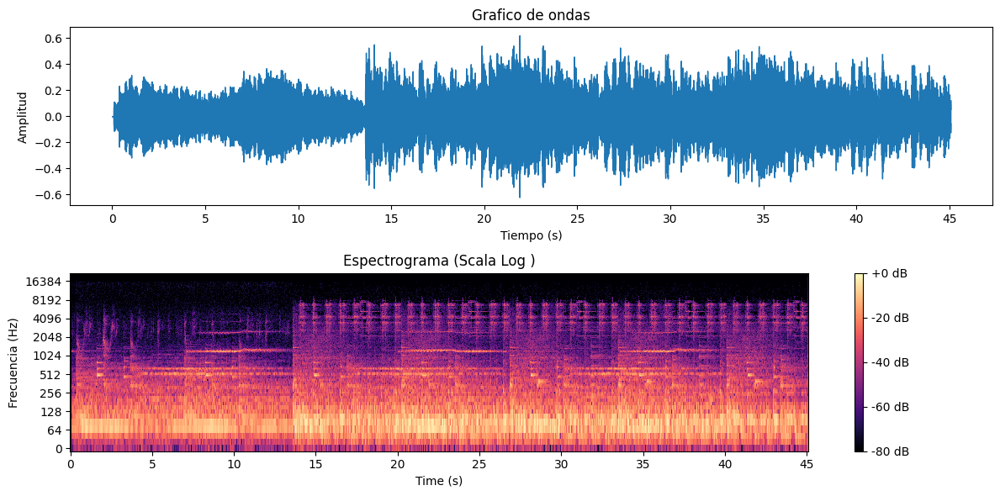

In [26]:
#Ejemplo de Arousal bajo
print("Id va de 0 a ",len(arousal_low))
audio_id = 0
audio_path = "/content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio"
if not arousal_low.empty:
    print("Ejemplo de arousal bajo:", arousal_low.iloc[0])
    low_audio_path = os.path.join(audio_path, f"{int(arousal_low.iloc[audio_id]['song_id'])}.mp3")
    play_audio_with_visuals(low_audio_path)

Id can be 0 to  51
Ejemplo de arousal medio: song_id         105.00
valence_mean      6.50
valence_std       1.43
arousal_mean      5.00
arousal_std       1.41
Name: 79, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/105.mp3


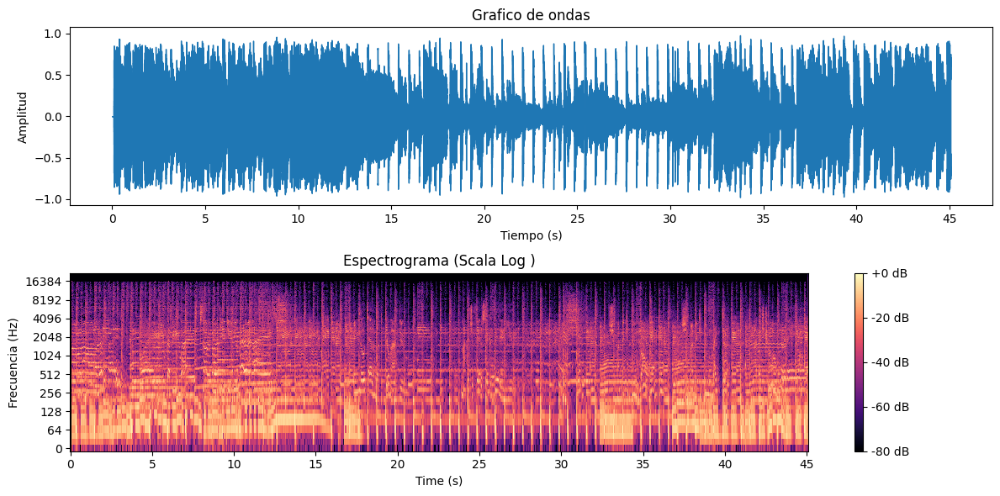

In [27]:
#Ejemplo de arousal medio
print("Id va de 0 a ",len(arousal_medium))
audio_id = 0
if not arousal_medium.empty:
    print("Ejemplo de arousal medio:", arousal_medium.iloc[0])
    final_audio_path = os.path.join(audio_path, f"{int(arousal_medium.iloc[audio_id]['song_id'])}.mp3")
    play_audio_with_visuals(final_audio_path)

Id va de 0 a  10
Ejemplo de arousal alto: song_id         115.00
valence_mean      8.40
valence_std       0.66
arousal_mean      7.80
arousal_std       1.17
Name: 89, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/115.mp3


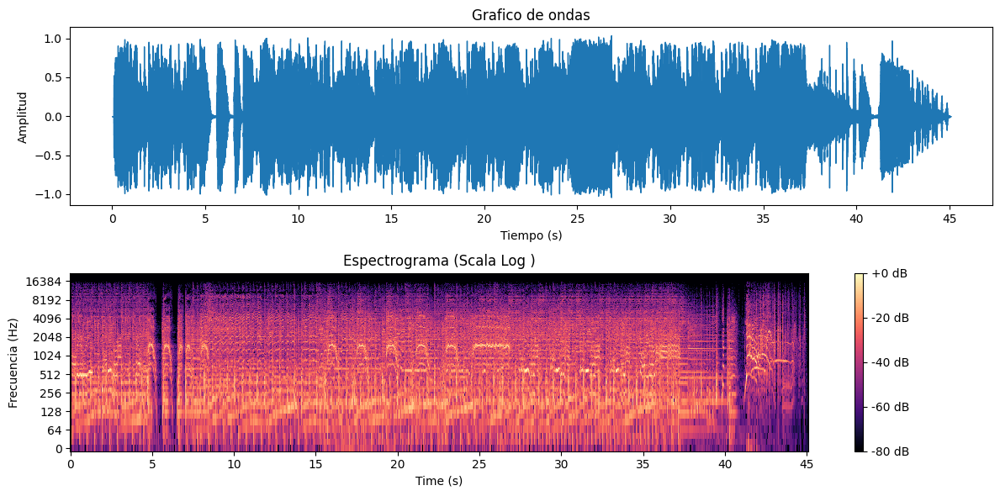

In [28]:
#Ejemplo de arousal alto

print("Id va de 0 a ",len(arousal_high))
audio_id = 0
if not arousal_high.empty:
    print("Ejemplo de arousal alto:", arousal_high.iloc[0])
    final_audio_path = os.path.join(audio_path, f"{int(arousal_high.iloc[audio_id]['song_id'])}.mp3")
    play_audio_with_visuals(final_audio_path)

Id va de 0 a  5
Ejemplo de valencia baja: song_id         115.00
valence_mean      8.40
valence_std       0.66
arousal_mean      7.80
arousal_std       1.17
Name: 89, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/198.mp3


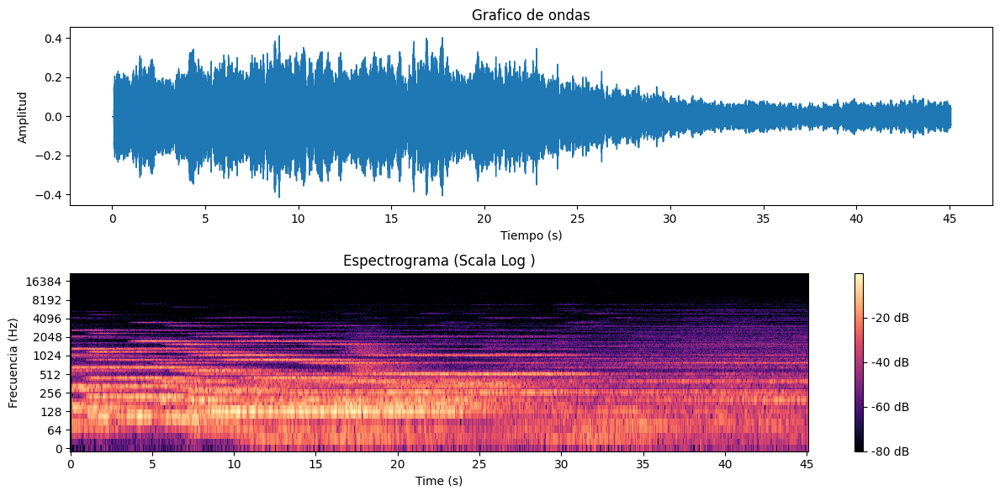

In [29]:
#Ejemplo de valencia baja
print("Id va de 0 a ",len(valence_low))
audio_id = 0
if not arousal_high.empty:
    print("Ejemplo de valencia baja:", arousal_high.iloc[0])
    final_audio_path = os.path.join(audio_path, f"{int(valence_low.iloc[audio_id]['song_id'])}.mp3")
    play_audio_with_visuals(final_audio_path)

Id va de 0 a  52
Ejemplo de valencia media song_id         150.00
valence_mean      5.00
valence_std       2.45
arousal_mean      5.40
arousal_std       2.20
Name: 120, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/150.mp3


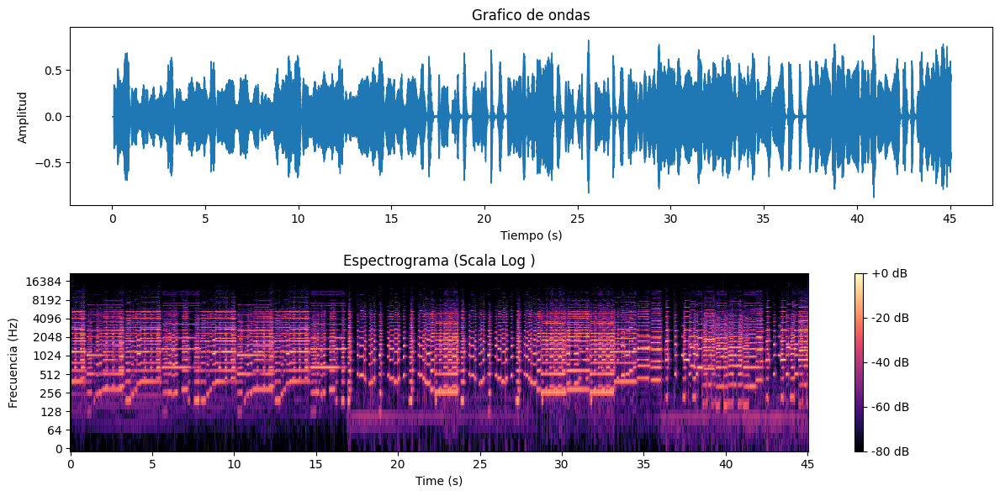

In [30]:
#Ejemplo de valencia media
print("Id va de 0 a ",len(valence_medium))
audio_id = 0
if not valence_medium.empty:
    print("Ejemplo de valencia media", valence_medium.iloc[0])
    final_audio_path = os.path.join(audio_path, f"{int(valence_medium.iloc[audio_id]['song_id'])}.mp3")
    play_audio_with_visuals(final_audio_path)

Id va de 0 a  10
Ejemplo de valencia alta song_id         25.00
valence_mean     7.90
valence_std      0.70
arousal_mean     4.70
arousal_std      2.53
Name: 16, dtype: float64
Reproduciendo: /content/deam-mediaeval-dataset-emotional-analysis-in-music/DEAM_audio/MEMD_audio/25.mp3


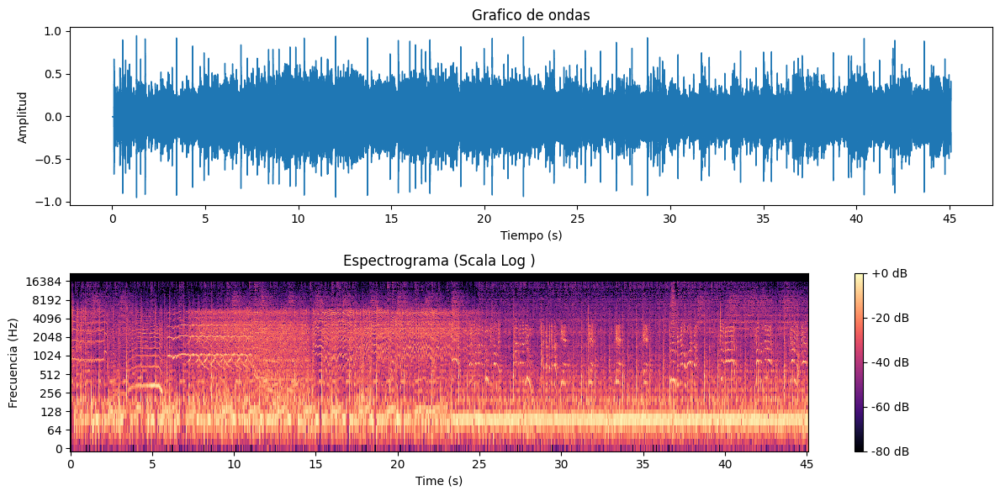

In [31]:
#Ejemplo de valencia alta
print("Id va de 0 a ",len(valence_high))
audio_id = 0
if not valence_high.empty:
    print("Ejemplo de valencia alta", valence_high.iloc[0])
    final_audio_path = os.path.join(audio_path, f"{int(valence_high.iloc[audio_id]['song_id'])}.mp3")  # Corrected syntax
    play_audio_with_visuals(final_audio_path)

#ENSA

El Emotional Non-Superstar Artist-Dataset (ENSA) es un dataset musical diseñado para superar limitaciones de otros conjuntos de datos y mitigar sesgos en sistemas de recomendación musical.
Características clave del dataset ENSA:

Canciones originales y completas de artistas noveles.

Estructura musical detallada mediante metadatos.

Evaluación emocional tanto por los artistas como por los oyentes.

Evaluación de "me gusta" o "no me gusta" por parte de los oyentes.
Composición del dataset:

60 canciones de 10 artistas nuevos.

234 minutos de música en total.

260 características de bajo nivel extraídas cada 500 ms.
Propósito y diseño:

Diseñado para abordar sesgos preexistentes.

Útil para analizar la relación entre la intención emocional del artista y la percepción del oyente.
**Preparación del dataset:**

Se recolectaron canciones originales de artistas noveles.

Se obtuvo el consentimiento de los artistas para el uso no comercial de su música.

Los artistas proporcionaron información sobre el género musical y las emociones que intentaban evocar con su música.

Se diseñó un cuestionario web para que los oyentes evaluaran las canciones.

In [32]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [34]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

arousals_path = "/content/drive/MyDrive/ia2&pdg/ENSA/arousals.csv"
valencias_path = "/content/drive/MyDrive/ia2&pdg/ENSA/valencias.csv"

# Leer archivos como listas
with open(arousals_path, "r", encoding="utf-8") as file:
    arousals_data = [line.strip().split(",") for line in file]

with open(valencias_path, "r", encoding="utf-8") as file:
    valencias_data = [line.strip().split(",") for line in file]

# Convertir las listas en DataFrames, llenando con NaN donde falten datos
df_arousals = pd.DataFrame(arousals_data).apply(pd.to_numeric, errors='coerce')
df_valencias = pd.DataFrame(valencias_data).apply(pd.to_numeric, errors='coerce')

# Mostrar información básica de los datos
print("Información de Arousal:")
print(df_arousals.info())

print("\nInformación de Valencia:")
print(df_valencias.info())

# Mostrar algunas filas
df_arousals.head(), df_valencias.head()


Información de Arousal:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Columns: 461 entries, 0 to 460
dtypes: float64(460), int64(1)
memory usage: 219.8 KB
None

Información de Valencia:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Columns: 461 entries, 0 to 460
dtypes: float64(460), int64(1)
memory usage: 219.8 KB
None


(   0    1          2         3         4         5         6         7    \
 0    1  NaN  -3.555346  2.938577 -0.258982  0.358606  0.082432  0.582438   
 1    2  NaN   1.766205 -0.522739 -0.429984 -0.208376 -0.119858 -0.175972   
 2    3  NaN  -8.648472 -0.782790  0.018048 -0.226829 -0.145598 -0.013724   
 3    4  NaN  11.557051 -0.364467 -0.170582  0.158215  0.095891  0.195274   
 4    5  NaN   6.419261 -1.665255  0.468152  0.321830 -0.029613  0.153902   
 
         8         9    ...  451  452  453  454  455  456  457  458  459  460  
 0  0.285718  0.734017  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  
 1  0.101854 -0.050652  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  
 2 -0.082440  0.115691  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  
 3  0.018264  0.037720  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  
 4  0.166204  0.439375  ...  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  NaN  
 
 [5 rows x 461 columns],
    0    1         2         

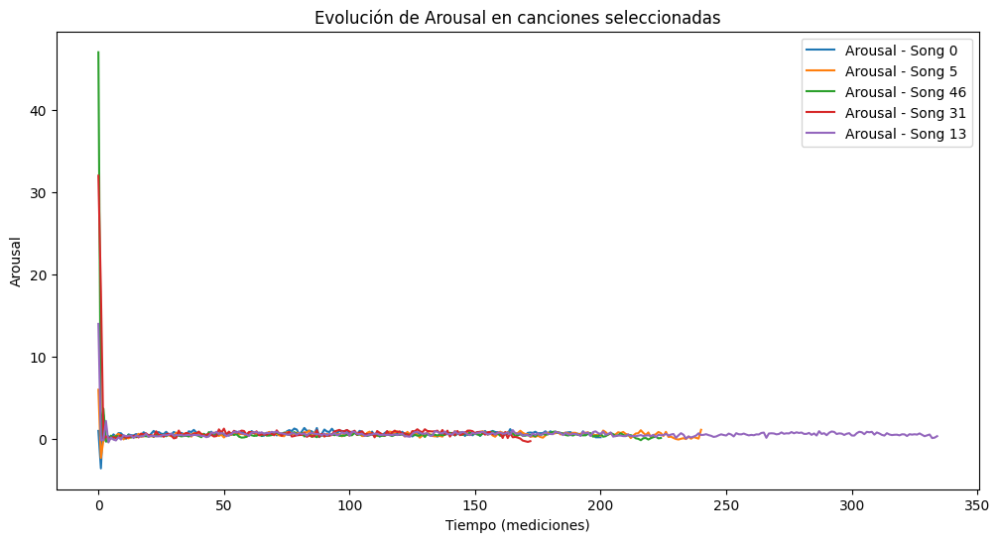

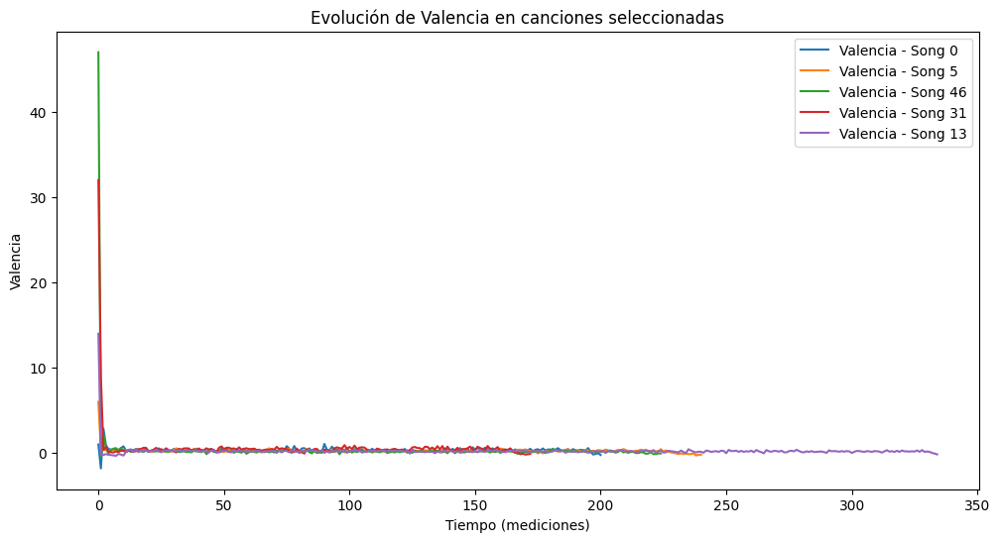

In [35]:
np.random.seed(42)  # Para reproducibilidad
sample_songs = np.random.choice(df_arousals.index, size=5, replace=False)

# Graficar Arousal en el tiempo
plt.figure(figsize=(12, 6))
for song in sample_songs:
    plt.plot(df_arousals.loc[song].dropna().values, label=f'Arousal - Song {song}')
plt.title("Evolución de Arousal en canciones seleccionadas")
plt.xlabel("Tiempo (mediciones)")
plt.ylabel("Arousal")
plt.legend()
plt.show()

# Graficar Valencia en el tiempo
plt.figure(figsize=(12, 6))
for song in sample_songs:
    plt.plot(df_valencias.loc[song].dropna().values, label=f'Valencia - Song {song}')
plt.title("Evolución de Valencia en canciones seleccionadas")
plt.xlabel("Tiempo (mediciones)")
plt.ylabel("Valencia")
plt.legend()
plt.show()

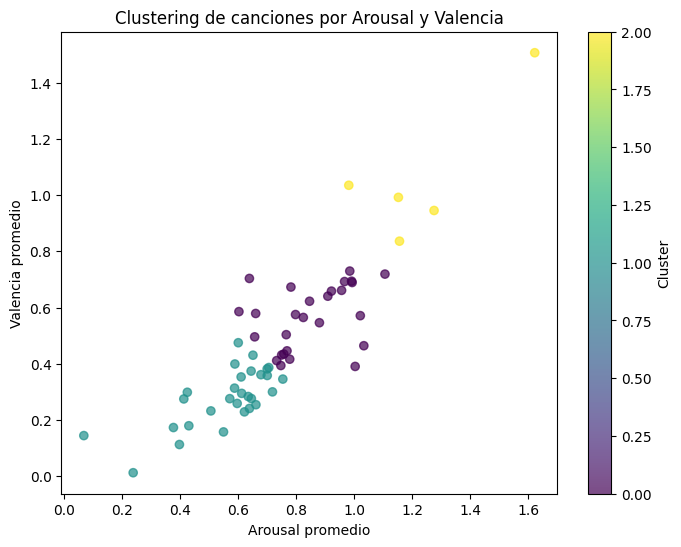

,Arousal,Valencia,Cluster
0,0.679329,0.361282,1
1,0.700710,0.381795,1
2,0.069366,0.144709,1
3,0.550435,0.157756,1
4,0.597539,0.259015,1


In [36]:
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler

# Calcular el promedio de Arousal y Valencia por canción
arousal_mean = df_arousals.mean(axis=1)
valencia_mean = df_valencias.mean(axis=1)

# Características
df_features = pd.DataFrame({'Arousal': arousal_mean, 'Valencia': valencia_mean})

# Normalizar los datos
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_features)

#  K-Means con 3 clusters
kmeans = KMeans(n_clusters=3, random_state=42, n_init=10)
df_features['Cluster'] = kmeans.fit_predict(df_scaled)

# Visualizar
plt.figure(figsize=(8,6))
plt.scatter(df_features['Arousal'], df_features['Valencia'], c=df_features['Cluster'], cmap='viridis', alpha=0.7)
plt.xlabel('Arousal promedio')
plt.ylabel('Valencia promedio')
plt.title('Clustering de canciones por Arousal y Valencia')
plt.colorbar(label='Cluster')
plt.show()

df_features.head()


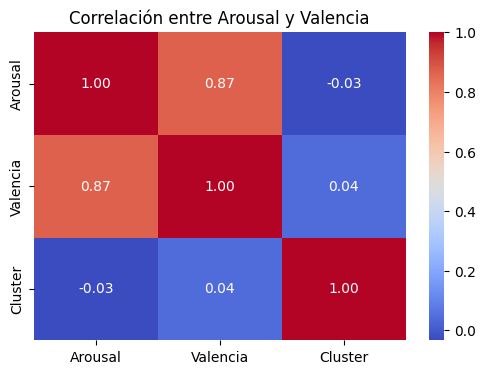

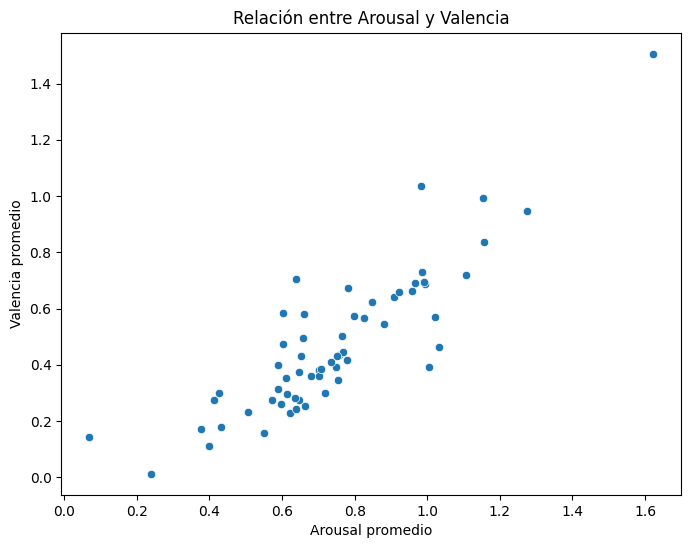

In [37]:
import seaborn as sns

correlation = df_features.corr()

# Grafica correlación
plt.figure(figsize=(6, 4))
sns.heatmap(correlation, annot=True, cmap='coolwarm', fmt=".2f")
plt.title("Correlación entre Arousal y Valencia")
plt.show()

# scatter plot
plt.figure(figsize=(8,6))
sns.scatterplot(x=df_features['Arousal'], y=df_features['Valencia'])
plt.xlabel('Arousal promedio')
plt.ylabel('Valencia promedio')
plt.title('Relación entre Arousal y Valencia')
plt.show()


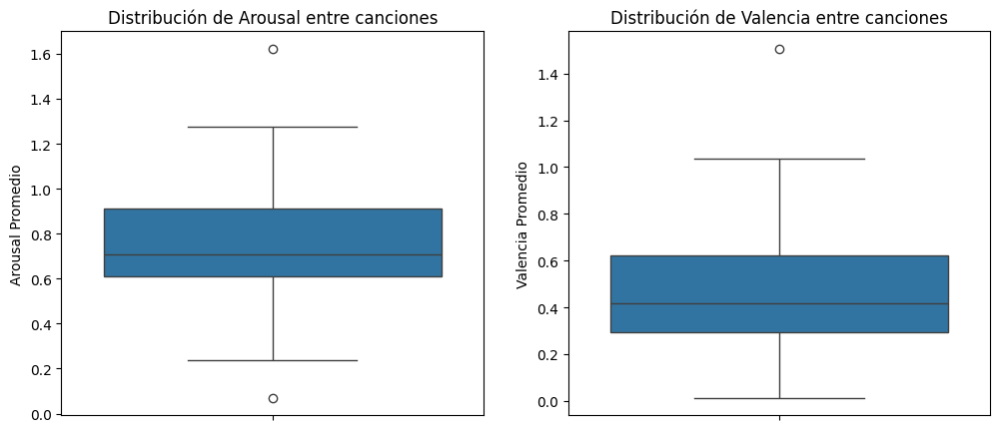

,Arousal,Valencia,Cluster
count,61.000000,61.000000,61.000000
mean,0.744803,0.471917,0.639344
std,0.252751,0.255637,0.633319
min,0.069366,0.012661,0.000000
25%,0.611115,0.294836,0.000000
50%,0.706308,0.416343,1.000000
75%,0.909728,0.622432,1.000000
max,1.622287,1.506076,2.000000


In [38]:
plt.figure(figsize=(12, 5))

# Boxplot  Arousal
plt.subplot(1,2,1)
sns.boxplot(y=arousal_mean)
plt.title("Distribución de Arousal entre canciones")
plt.ylabel("Arousal Promedio")

# Boxplot  Valencia
plt.subplot(1,2,2)
sns.boxplot(y=valencia_mean)
plt.title("Distribución de Valencia entre canciones")
plt.ylabel("Valencia Promedio")

plt.show()

#Estadísticas descriptivas
df_features.describe()


# SPOTIFY API

Es una interfaz que permite acceder al catálogo de música de Spotify e integrar sus servicios en aplicaciones web y móviles.
Aquí hay algunos puntos clave sobre la API de Spotify:

**Funcionalidades principales:**
Permite integrar aplicaciones propias en entornos web y móvil a los servicios de Spotify.

Da acceso al catálogo musical de Spotify.

Permite obtener información (metadata) en formato JSON sobre artistas, álbumes y canciones almacenadas en el catálogo de Spotify.

Da acceso directo a las listas de reproducción creadas para un perfil de usuario en particular.

**Características de audio (audio object features):**
La API cuenta con una entidad conocida como audio object features que dispone de 18 características.

Entre estas características, valence y energy son relevantes para el reconocimiento de emociones en la música.

Valence se asocia con lo positiva que puede ser una canción, con valores cercanos a 1 para emociones positivas y cercanos a 0 para emociones negativas.

Desde el punto de vista de los modelos emocionales, estas dos características (valence y energy) pueden analizarse como una coordenada de tipo energy-valence


# GTZAN Dataset

Creado en 2002, contiene 1000 archivos de audio con una duración de 30 segundos cada uno. No incluye información sobre la estructura musical, artistas no famosos, ni etiquetado emocional por artista u oyente.
Tiene información sobre ritmos y su diferenciación lo que puede ser útil para tener en cuenta a la hora de recomendar


In [45]:
gtzan_link="https://www.kaggle.com/datasets/andradaolteanu/gtzan-dataset-music-genre-classification"
od.download(gtzan_link)

Skipping, found downloaded files in "./gtzan-dataset-music-genre-classification" (use force=True to force download)


In [51]:

import os

directory_path = "./gtzan-dataset-music-genre-classification/Data"

# Check if the directory exists
if os.path.exists(directory_path):
    items = os.listdir(directory_path)

    print(f"Files and directories in '{directory_path}':")
    for item in items:
        print(item)
else:
    print(f"Directory '{directory_path}' not found.")


Files and directories in './gtzan-dataset-music-genre-classification/Data':
genres_original
features_30_sec.csv
features_3_sec.csv
images_original


In [52]:
df = pd.read_csv('./gtzan-dataset-music-genre-classification/Data/features_3_sec.csv')
df.head()

,filename,length,chroma_stft_mean,chroma_stft_var,rms_mean,rms_var,spectral_centroid_mean,spectral_centroid_var,spectral_bandwidth_mean,spectral_bandwidth_var,...,mfcc16_var,mfcc17_mean,mfcc17_var,mfcc18_mean,mfcc18_var,mfcc19_mean,mfcc19_var,mfcc20_mean,mfcc20_var,label
0,blues.00000.0.wav,66149,0.335406,0.091048,0.130405,0.003521,1773.065032,167541.630869,1972.744388,117335.771563,...,39.687145,-3.241280,36.488243,0.722209,38.099152,-5.050335,33.618073,-0.243027,43.771767,blues
1,blues.00000.1.wav,66149,0.343065,0.086147,0.112699,0.001450,1816.693777,90525.690866,2010.051501,65671.875673,...,64.748276,-6.055294,40.677654,0.159015,51.264091,-2.837699,97.030830,5.784063,59.943081,blues
2,blues.00000.2.wav,66149,0.346815,0.092243,0.132003,0.004620,1788.539719,111407.437613,2084.565132,75124.921716,...,67.336563,-1.768610,28.348579,2.378768,45.717648,-1.938424,53.050835,2.517375,33.105122,blues
3,blues.00000.3.wav,66149,0.363639,0.086856,0.132565,0.002448,1655.289045,111952.284517,1960.039988,82913.639269,...,47.739452,-3.841155,28.337118,1.218588,34.770935,-3.580352,50.836224,3.630866,32.023678,blues
4,blues.00000.4.wav,66149,0.335579,0.088129,0.143289,0.001701,1630.656199,79667.267654,1948.503884,60204.020268,...,30.336359,0.664582,45.880913,1.689446,51.363583,-3.392489,26.738789,0.536961,29.146694,blues


In [53]:
print("El dataset tiene",df.shape)
print("Positivos y negativos")
df.label.value_counts().reset_index()

El dataset tiene (9990, 60)
Positivos y negativos


,label,count
0,blues,1000
1,jazz,1000
2,metal,1000
3,pop,1000
4,reggae,1000
5,disco,999
6,classical,998
7,hiphop,998
8,rock,998
9,country,997


In [54]:
#Visualización
audio_fp = './gtzan-dataset-music-genre-classification/Data/genres_original/blues/blues.00000.wav'
audio_data, sr = librosa.load(audio_fp)
audio_data, _ = librosa.effects.trim(audio_data)

In [57]:
import librosa, IPython
import librosa.display as lplt

IPython.display.Audio(audio_data, rate=sr)



<ipython-input-60-dc30ed650620>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');


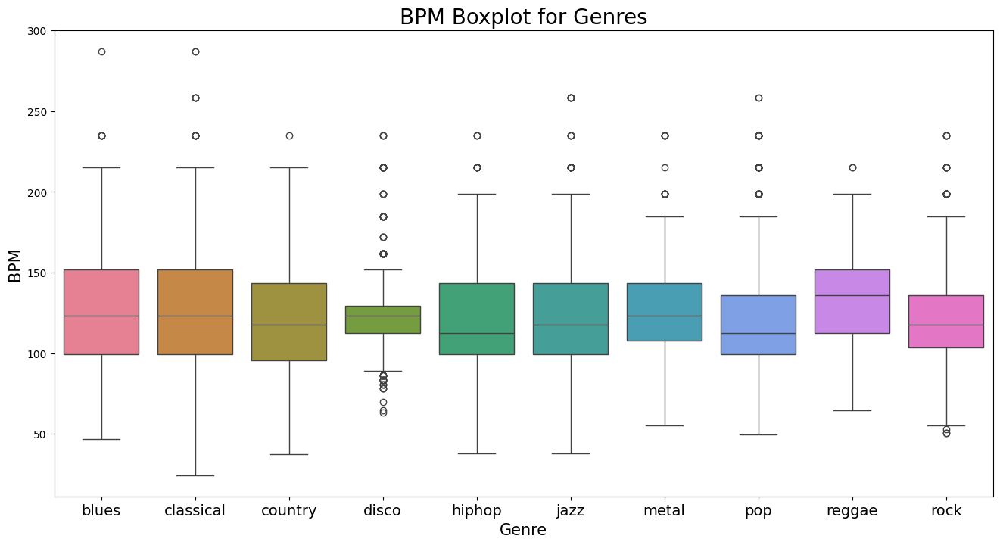

In [60]:
x = df[["label", "tempo"]]

fig, ax = plt.subplots(figsize=(16, 8));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');

plt.title('BPM Boxplot for Genres', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)
plt.savefig("BPM_Boxplot.png")

# Spotify_1Million_Tracks

https://www.kaggle.com/datasets/amitanshjoshi/spotify-1million-tracks

Como una versión local extraida de spotify. Este conjunto de datos se extrajo de la plataforma Spotify mediante la biblioteca Python "Spotipy", que permite a los usuarios acceder a datos musicales proporcionados a través de API. El conjunto de datos recopilado incluye alrededor de 1 millón de pistas con 19 características entre 2000 y 2023. Además, hay un total de 61.445 artistas únicos y 82 géneros en los datos.

Dimensiones del dataset: (1159764, 19)

Primeras filas:
     artist_name        track_name                track_id  popularity  year  \
0     Jason Mraz   I Won't Give Up  53QF56cjZA9RTuuMZDrSA6          68  2012   
1     Jason Mraz  93 Million Miles  1s8tP3jP4GZcyHDsjvw218          50  2012   
2  Joshua Hyslop  Do Not Let Me Go  7BRCa8MPiyuvr2VU3O9W0F          57  2012   
3   Boyce Avenue          Fast Car  63wsZUhUZLlh1OsyrZq7sz          58  2012   
4   Andrew Belle  Sky's Still Blue  6nXIYClvJAfi6ujLiKqEq8          54  2012   

      genre  danceability  energy  key  loudness  mode  speechiness  \
0  acoustic         0.483   0.303    4   -10.058     1       0.0429   
1  acoustic         0.572   0.454    3   -10.286     1       0.0258   
2  acoustic         0.409   0.234    3   -13.711     1       0.0323   
3  acoustic         0.392   0.251   10    -9.845     1       0.0363   
4  acoustic         0.430   0.791    6    -5.419     0       0.0302   

   acousticness  instrumentalness  l

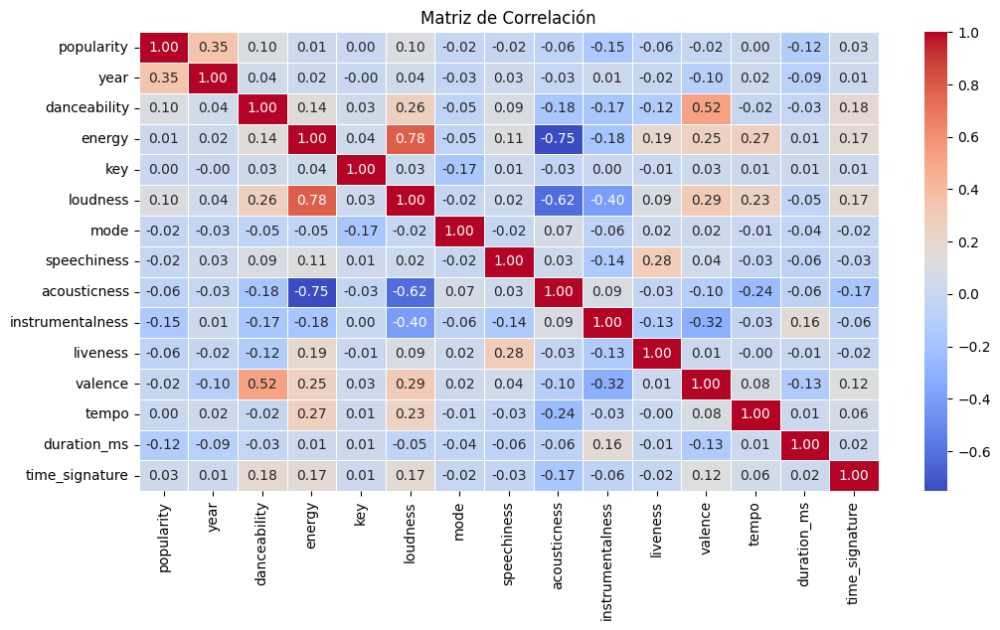

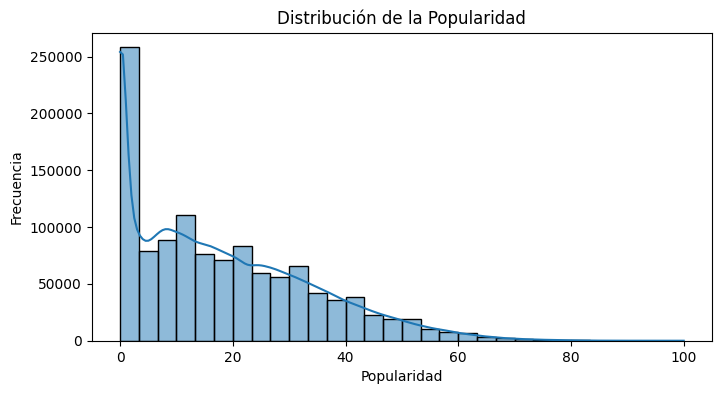

In [66]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

df_main = pd.read_csv("/content/drive/MyDrive/ia2&pdg/1milliontracks/spotify_data.csv").drop(['Unnamed: 0'], axis=1)

# Función de exploración
def df_explore(df):
    missing = pd.DataFrame((df.isna().sum()/df.shape[0])*100).reset_index().rename(columns={'index': 'column', 0: '%_missing'}).sort_values(by='%_missing', ascending=False)
    nunique = pd.DataFrame(df.nunique()).reset_index().rename(columns={'index': 'column', 0: 'nunique'}).sort_values(by='nunique', ascending=False)
    dtypes = pd.DataFrame(df.dtypes).reset_index().rename(columns={'index': 'column', 0: 'dtype'})

    # Unir todas las tablas
    summary = pd.merge(pd.merge(dtypes, missing, on='column'), nunique, on='column', how='left')
    return summary.sort_values(by='%_missing', ascending=False).sort_values(by='nunique', ascending=False)

# Información general
print("Dimensiones del dataset:", df_main.shape)
print("\nPrimeras filas:")
print(df_main.head())

# Exploración de datos
eda_summary = df_explore(df_main)
print("\nResumen de los datos:")
print(eda_summary)

# Eliminar valores nulos
df_main = df_main.dropna()

# Estadísticas descriptivas
print("\nEstadísticas descriptivas:")
print(df_main.describe())

# Filtrar columnas numéricas
df_numeric = df_main.select_dtypes(include=['number'])

# Matriz de correlación
plt.figure(figsize=(12, 6))
sns.heatmap(df_numeric.corr(), annot=True, cmap="coolwarm", fmt=".2f", linewidths=0.5)
plt.title("Matriz de Correlación")
plt.show()

# Distribución de valores en base a la popularidad)
plt.figure(figsize=(8, 4))
sns.histplot(df_main['popularity'], bins=30, kde=True)
plt.title("Distribución de la Popularidad")
plt.xlabel("Popularidad")
plt.ylabel("Frecuencia")
plt.show()
